# Urbanity - Network Data 
Urbanity is a global street network dataset from the Urban Analytics Lab (NUS) combining OSM networks with demographics, buildings, and street-view metrics.

This notebook integrates **Urbanity network analysis data** into 30m×30m grid cells for Urban Heat Island (UHI) modeling. Urbanity provides comprehensive street network metrics including centrality measures, building characteristics, population demographics, and street-level visual features.

## 1. Setup and Imports

Import required libraries for spatial data processing, network analysis, and UHI feature engineering.

In [2]:
import sys
import warnings
import io
from pathlib import Path
import geopandas as gpd
import pandas as pd
import numpy as np
import requests
import os
import matplotlib.pyplot as plt
import contextily as ctx
import matplotlib as mpl

# Ensure src is in the path for local imports
sys.path.append(str(Path.cwd().parent))
from src.bbox_utils import clip_to_city_bbox

warnings.filterwarnings('ignore')

# Add src to path
sys.path.append('../src')
from bbox_utils import get_city_bbox_gdf, clip_to_city_bbox, STUDY_CITIES


PROJECT_ROOT = Path('..').resolve()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))
    
FIG_DIR = PROJECT_ROOT / 'results' / 'figures'
FIG_DIR.mkdir(parents=True, exist_ok=True)

In [3]:
# Paths and URL to download Urbanity data
CITIES = ['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Madrid', 'Paris']

DATA_DIR = Path('../data/0-raw/Urbanity')
DATA_DIR.mkdir(parents=True, exist_ok=True)

PROCESSED_DIR = Path('../data/1-processed/Urbanity')
PROCESSED_DIR.mkdir(parents=True, exist_ok=True)

# Output files - single combined files
COMBINED_NODES_FILE = DATA_DIR / "urbanity_nodes.parquet"
COMBINED_EDGES_FILE = DATA_DIR / "urbanity_edges.parquet"

# Clipped output files
CLIPPED_NODES_FILE = PROCESSED_DIR / "urbanity_nodes_clipped.parquet"
CLIPPED_EDGES_FILE = PROCESSED_DIR / "urbanity_edges_clipped.parquet"

GRID_RESOLUTIONS = [30, 60, 90]
GRID_DIR = Path('../data/utils/grids')

# Missing value strategy for consistent data handling
MISSING_VALUE_STRATEGY = {
    'counts': 0,          # node_count, edge_count, building_count
    'lengths': 0,         # street_length
    'densities': 0,       # population densities
    'proportions': 0,     # building_footprint_proportion
    'ratios': np.nan,     # canyon_ratio, meshedness (undefined when no data)
    'indices': np.nan,    # orientation_index, intersection_density
    'views': np.nan       # streetview features (missing observations)
}

# Urbanity data URLs from Figshare
URBANITY_URLS = {
    'Amsterdam': {
        'nodes': "https://figshare.com/ndownloader/files/40160350",
        'edges': "https://figshare.com/ndownloader/files/40160347"
    },
    'Athens': {
        'nodes': "https://figshare.com/ndownloader/files/40160368",
        'edges': "https://figshare.com/ndownloader/files/40160365"
    },
    'Barcelona': {
        'nodes': "https://figshare.com/ndownloader/files/40160377",
        'edges': "https://figshare.com/ndownloader/files/40160374"
    },
    'Berlin': {
        'nodes': "https://figshare.com/ndownloader/files/40160389",
        'edges': "https://figshare.com/ndownloader/files/40160386"
    },
    'Madrid': {
        'nodes': "https://figshare.com/ndownloader/files/40160455",
        'edges': "https://figshare.com/ndownloader/files/40160452"
    },
    'Paris': {
        'nodes': "https://figshare.com/ndownloader/files/40454414",
        'edges': "https://figshare.com/ndownloader/files/40454411"
    }
}

## 2. Data Download

In [4]:
# Download data at city level and combine
if not COMBINED_NODES_FILE.exists() or not COMBINED_EDGES_FILE.exists():
    all_nodes, all_edges = [], []
    
    for city in STUDY_CITIES:
        if city not in URBANITY_URLS:
            continue
        print(f"Downloading {city}...")
        
        for dtype, url in URBANITY_URLS[city].items():
            response = requests.get(url)
            gdf = gpd.read_file(io.BytesIO(response.content))
            gdf['city'] = city
            (all_nodes if dtype == 'nodes' else all_edges).append(gdf)
    
    # Combine and save
    gpd.GeoDataFrame(pd.concat(all_nodes, ignore_index=True)).to_parquet(COMBINED_NODES_FILE)
    gpd.GeoDataFrame(pd.concat(all_edges, ignore_index=True)).to_parquet(COMBINED_EDGES_FILE)

nodes_gdf = gpd.read_parquet(COMBINED_NODES_FILE)
edges_gdf = gpd.read_parquet(COMBINED_EDGES_FILE)
print(f"Loaded {len(nodes_gdf):,} nodes and {len(edges_gdf):,} edges")

Loaded 362,278 nodes and 985,200 edges


In [5]:
# Clip data to city bounding boxes
if not CLIPPED_NODES_FILE.exists() or not CLIPPED_EDGES_FILE.exists():
    print("Clipping to city bboxes...")
    
    clipped_nodes = clip_to_city_bbox(nodes_gdf, nodes_gdf['city'].iloc[0])
    clipped_edges = clip_to_city_bbox(edges_gdf, edges_gdf['city'].iloc[0])
    
    for city in STUDY_CITIES[1:]:
        city_nodes = nodes_gdf[nodes_gdf['city'] == city]
        city_edges = edges_gdf[edges_gdf['city'] == city]
        
        if len(city_nodes) > 0:
            clipped_nodes = pd.concat([clipped_nodes, clip_to_city_bbox(city_nodes, city)], ignore_index=True)
        if len(city_edges) > 0:
            clipped_edges = pd.concat([clipped_edges, clip_to_city_bbox(city_edges, city)], ignore_index=True)
    
    clipped_nodes.to_parquet(CLIPPED_NODES_FILE)
    clipped_edges.to_parquet(CLIPPED_EDGES_FILE)

clipped_nodes_gdf = gpd.read_parquet(CLIPPED_NODES_FILE)
clipped_edges_gdf = gpd.read_parquet(CLIPPED_EDGES_FILE)

print(f"Total clipped: {len(clipped_nodes_gdf):,} nodes, {len(clipped_edges_gdf):,} edges")
print("Nodes and edges by city:")
for city in STUDY_CITIES:
    nodes_count = len(clipped_nodes_gdf[clipped_nodes_gdf['city'] == city])
    edges_count = len(clipped_edges_gdf[clipped_edges_gdf['city'] == city])
    print(f"  {city}: {nodes_count:,} nodes, {edges_count:,} edges")


Total clipped: 3,390 nodes, 11,062 edges
Nodes and edges by city:
  Amsterdam: 368 nodes, 1,294 edges
  Athens: 1,198 nodes, 4,010 edges
  Barcelona: 519 nodes, 1,704 edges
  Berlin: 376 nodes, 1,094 edges
  Madrid: 428 nodes, 1,362 edges
  Paris: 501 nodes, 1,598 edges


In [6]:
print("Node columns:", nodes_gdf.columns)
print("Edge columns:", edges_gdf.columns)

Node columns: Index(['node_id', 'osmid', 'x', 'y', 'Node Density', 'Street Length', 'Degree',
       'Clustering', 'Clustering (Weighted)', 'Closeness Centrality',
       'Betweenness Centrality', 'Eigenvector Centrality', 'Katz Centrality',
       'PageRank', 'Footprint Proportion', 'Footprint Mean', 'Footprint Stdev',
       'Perimeter Total', 'Perimeter Mean', 'Perimeter Stdev',
       'Complexity Mean', 'Complexity Stdev', 'Building Count', 'PopSum',
       'Men', 'Women', 'Elderly', 'Youth', 'Children', 'Civic', 'Commercial',
       'Entertainment', 'Food', 'Healthcare', 'Institutional', 'Recreational',
       'Social', 'Green View Mean', 'Green View Stdev', 'Sky View Mean',
       'Sky View Stdev', 'Building View Mean', 'Building View Stdev',
       'Road View Mean', 'Road View Stdev', 'Visual Complexity Mean',
       'Visual Complexity Stdev', 'geometry', 'city'],
      dtype='object')
Edge columns: Index(['edge_id', 'u', 'v', 'length', 'Footprint Total', 'Footprint Mean',
     

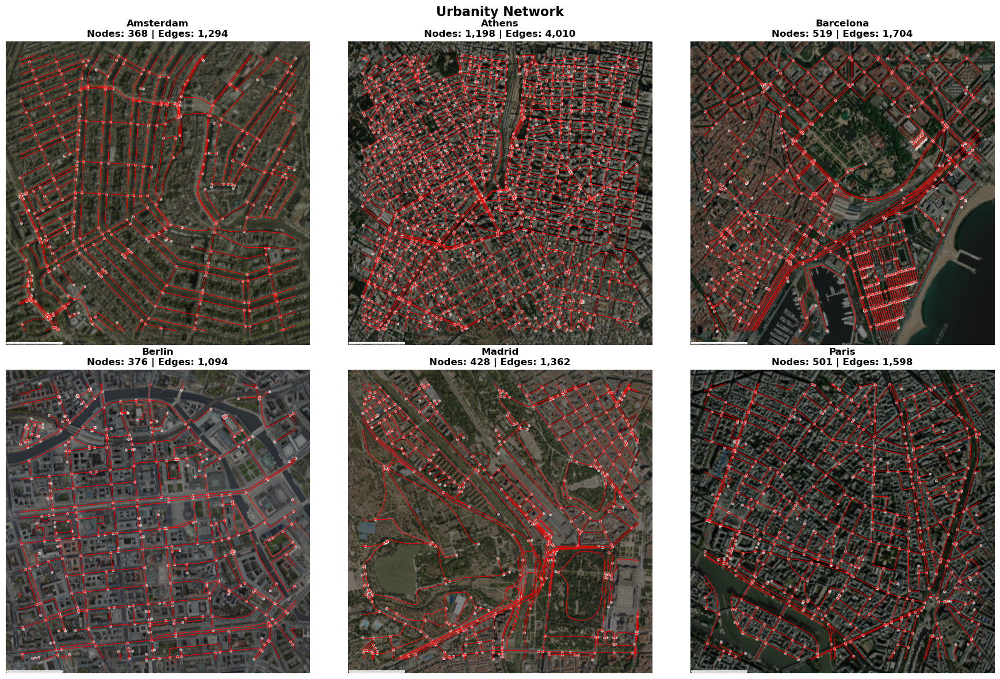

Saved figure to /Users/gerardoezequiel/Developer/ShapingCoolCities/results/figures/urbanity_network_panels.png


In [7]:
# Visualise nodes and edges for all cities with two basemaps: dark and satellite (satellite at 0.5 opacity)
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()
cities = ['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Madrid', 'Paris']

for i, city in enumerate(cities):
    ax = axes[i]
    city_nodes = clipped_nodes_gdf[clipped_nodes_gdf['city'] == city]
    city_edges = clipped_edges_gdf[clipped_edges_gdf['city'] == city]
    crs = city_edges.crs if len(city_edges) > 0 else city_nodes.crs
    if len(city_edges) > 0:
        city_edges.plot(ax=ax, color='red', alpha=0.6, linewidth=0.8)
    if len(city_nodes) > 0:
        city_nodes.plot(ax=ax, color='white', markersize=8, alpha=0.5)
    if crs is not None:
        ctx.add_basemap(
            ax,
            source=ctx.providers.CartoDB.DarkMatter,
            crs=crs,
            attribution_size=1
        )
        ctx.add_basemap(
            ax,
            source=ctx.providers.Esri.WorldImagery,
            crs=crs,
            alpha=0.5,
            attribution_size=1
        )
    ax.set_title(f'{city}\nNodes: {len(city_nodes):,} | Edges: {len(city_edges):,}', fontsize=12, fontweight='bold')
    ax.set_axis_off()

plt.suptitle('Urbanity Network', fontsize=16, fontweight='bold')
plt.tight_layout()
fig_path = FIG_DIR / 'urbanity_network_panels.png'
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved figure to {fig_path}')


## 4. Grid Integration

In [8]:
def load_city_data(grid_path, nodes_gdf, edges_gdf, city_name):
    """Load and prepare data for a single city"""
    print(f"Processing {city_name}...")
    
    # Load and filter grid by city
    grid_full = gpd.read_parquet(grid_path)
    city_key = city_name.strip().title()
    grid = grid_full[grid_full['city'].astype(str).str.title() == city_key].copy()
    
    if len(grid) == 0:
        print(f"No grid cells found for city: {city_name}")
        return None, None, None
    
    # Filter network data by city
    nodes = nodes_gdf[nodes_gdf['city'].astype(str).str.title() == city_key].copy()
    edges = edges_gdf[edges_gdf['city'].astype(str).str.title() == city_key].copy()
    
    print(f"  Grid: {len(grid):,} | Nodes: {len(nodes):,} | Edges: {len(edges):,}")
    return grid, nodes, edges

# Amsterdam data for testing
grid_path = '../data/utils/grids/all_cities_30m_grid.parquet'
amsterdam_grid, amsterdam_nodes, amsterdam_edges = load_city_data(
    grid_path, clipped_nodes_gdf, clipped_edges_gdf, 'Amsterdam'
)
print(f"Amsterdam loaded: {len(amsterdam_grid)} cells, {len(amsterdam_nodes)} nodes, {len(amsterdam_edges)} edges")
print(f"CRS: grid=EPSG:3857, nodes=EPSG:4326, edges=EPSG:4326")

Processing Amsterdam...
  Grid: 6,724 | Nodes: 368 | Edges: 1,294
Amsterdam loaded: 6724 cells, 368 nodes, 1294 edges
CRS: grid=EPSG:3857, nodes=EPSG:4326, edges=EPSG:4326


In [9]:
def prepare_crs_and_grid_id(grid, nodes, edges):
    """Standardize CRS and ensure grid_id column exists"""
    # Convert to EPSG:3857 and return the converted gdfs
    if grid.crs != 'EPSG:3857':
        grid = grid.to_crs('EPSG:3857')
    if nodes.crs != 'EPSG:3857':
        nodes = nodes.to_crs('EPSG:3857')
    if edges.crs != 'EPSG:3857':
        edges = edges.to_crs('EPSG:3857')
    
    # Add length for edges
    edges['length'] = edges.geometry.length
    
    # Ensure grid_id column
    if 'global_grid_id' not in grid.columns:
        if grid.index.name == 'global_grid_id':
            grid = grid.reset_index()
        else:
            grid['global_grid_id'] = grid.index
            
    return grid, nodes, edges

# Amsterdam data for testing
amsterdam_grid, amsterdam_nodes, amsterdam_edges = prepare_crs_and_grid_id(
    amsterdam_grid, amsterdam_nodes, amsterdam_edges
)
print(f"CRS standardized to EPSG:3857")
print(f"Grid ID column exists: {'global_grid_id' in amsterdam_grid.columns}")
print(f"Edge lengths calculated: mean = {amsterdam_edges['length'].mean():.1f}m")

CRS standardized to EPSG:3857
Grid ID column exists: True
Edge lengths calculated: mean = 128.4m


In [10]:
def perform_spatial_joins(grid, nodes, edges):
    """Perform spatial joins between nodes/edges and grid"""
    grid_geom = grid[['global_grid_id', 'geometry']].copy()
    
    # Join nodes to grid
    nodes_joined = gpd.sjoin(nodes, grid_geom, how='left', predicate='within')
    nodes_matched = nodes_joined[nodes_joined['global_grid_id'].notna()].copy()
    
    # Weighted overlay for edges
    edges_overlay = gpd.overlay(edges, grid_geom, how='intersection')
    edges_overlay['segment_length'] = edges_overlay.geometry.length
    edges_overlay['weight'] = edges_overlay['segment_length'] / edges_overlay['length']
    edges_matched = edges_overlay[
        (edges_overlay['weight'] > 0) & 
        (edges_overlay['global_grid_id'].notna())
    ].copy()
    
    print(f"  Nodes matched: {len(nodes_matched)} | Edge segments: {len(edges_matched)}")
    return nodes_matched, edges_matched

# Spatial joins on Amsterdam data
amsterdam_nodes_matched, amsterdam_edges_matched = perform_spatial_joins(
    amsterdam_grid, amsterdam_nodes, amsterdam_edges
)
print(f"Spatial joins completed")
print(f"Cells with nodes: {amsterdam_nodes_matched['global_grid_id'].nunique()}")
print(f"Cells with edges: {amsterdam_edges_matched['global_grid_id'].nunique()}")
print(f"Average edge weight: {amsterdam_edges_matched['weight'].mean():.3f}")


  Nodes matched: 368 | Edge segments: 8225
Spatial joins completed
Cells with nodes: 317
Cells with edges: 2898
Average edge weight: 0.157


In [11]:
# Basic Features Function
def add_basic_features(result, nodes_matched, edges_matched):
    """Add basic count and length features"""
    result['node_count'] = nodes_matched.groupby('global_grid_id').size().reindex(result.index, fill_value=0).astype(int)
    
    edge_counts = edges_matched.groupby('global_grid_id')['edge_id'].nunique()
    result['edge_count'] = edge_counts.reindex(result.index, fill_value=0).astype(int)
    
    edges_matched['weighted_length'] = edges_matched['weight'] * edges_matched['length']
    street_lengths = edges_matched.groupby('global_grid_id')['weighted_length'].sum()
    result['street_length'] = street_lengths.reindex(result.index, fill_value=0.0)
    
    return result

# Basic features Amsterdam grid
amsterdam_result = amsterdam_grid.copy().set_index('global_grid_id')
amsterdam_result = add_basic_features(amsterdam_result, amsterdam_nodes_matched, amsterdam_edges_matched)
basic_stats = amsterdam_result[['node_count', 'edge_count', 'street_length']].describe().loc[['mean', 'max']]
print("Basic features added:")
print(f"   Average nodes per cell: {basic_stats.loc['mean', 'node_count']:.2f}")
print(f"   Average edges per cell: {basic_stats.loc['mean', 'edge_count']:.2f}")  
print(f"   Average street length: {basic_stats.loc['mean', 'street_length']:.1f}m")
print(f"   Max nodes in cell: {basic_stats.loc['max', 'node_count']:.0f}")
print(f"   Cells with data: {(amsterdam_result['node_count'] > 0).sum():,}/{len(amsterdam_result):,}")


Basic features added:
   Average nodes per cell: 0.05
   Average edges per cell: 1.22
   Average street length: 24.6m
   Max nodes in cell: 4
   Cells with data: 317/6,724


In [12]:
def add_centrality_features(result, nodes_matched):
    """Add network centrality features with degree weighting - Literature-optimised for UHI"""
    # Based on literature review: keep only UHI-relevant centrality measures
    # Degree (connectivity for wind flow)
    # Betweenness (traffic/activity heat proxy)  
    
    centrality_features = ['Degree', 'Betweenness Centrality']
    
    def degree_weighted_centrality(group):
        if len(group) == 0 or 'Degree' not in group.columns:
            return 0.0
        degrees = group['Degree']
        if degrees.sum() == 0:
            return group[group.columns[0]].mean()
        return (group[group.columns[0]] * degrees).sum() / degrees.sum()
    
    for feature in centrality_features:
        if feature in nodes_matched.columns:
            feature_name = feature.lower().replace(' ', '_').replace('_centrality', '')
            
            if feature == 'Degree':
                result[f'network_{feature_name}'] = nodes_matched.groupby('global_grid_id')[feature].sum().reindex(result.index, fill_value=0.0)
            else:
                centrality_data = nodes_matched[['global_grid_id', feature, 'Degree']].copy()
                weighted_centrality = centrality_data.groupby('global_grid_id').apply(
                    lambda group: degree_weighted_centrality(group[[feature, 'Degree']]), 
                    include_groups=False
                )
                result[f'network_{feature_name}'] = weighted_centrality.reindex(result.index, fill_value=0.0)
    

    if 'Closeness Centrality' in nodes_matched.columns:
        closeness = nodes_matched.groupby('global_grid_id')['Closeness Centrality'].mean()
        result['network_closeness'] = closeness.reindex(result.index, fill_value=0.0)
    return result

# Amsterdam centrality features (updated)
amsterdam_result = add_centrality_features(amsterdam_result, amsterdam_nodes_matched)
centrality_cols = [c for c in amsterdam_result.columns if c.startswith('network_')]
centrality_stats = amsterdam_result[centrality_cols].describe().loc[['mean', 'max']]
print("Centrality features added (Literature-optimised for UHI):")
for col in centrality_cols:
    nonzero = (amsterdam_result[col] > 0).sum()
    print(f"   {col}: {nonzero:,} cells, avg={centrality_stats.loc['mean', col]:.4f}, max={centrality_stats.loc['max', col]:.4f}")

print("Dropped low-impact features: network_clustering, network_closeness, network_pagerank")


Centrality features added (Literature-optimised for UHI):
   network_degree: 317 cells, avg=0.1789, max=16.0000
   network_betweenness: 230 cells, avg=0.0001, max=0.0020
   network_closeness: 317 cells, avg=0.0011, max=0.0240
Dropped low-impact features: network_clustering, network_closeness, network_pagerank


In [13]:
def add_population_features(result, nodes_matched):
    """Add population density features - Keep for vulnerability/risk analysis"""
    # Population features provide demographic context for UHI vulnerability assessment
    # Different age groups have varying heat sensitivity (elderly, children most vulnerable)
    population_features = ['PopSum', 'Elderly', 'Youth', 'Children']
    
    for feature in population_features:
        if feature in nodes_matched.columns:
            pop_totals = nodes_matched.groupby('global_grid_id')[feature].sum()
            result[f'population_{feature.lower()}_density'] = (pop_totals / 900).reindex(result.index, fill_value=0.0)
    
    return result

# Amsterdam population features (kept for vulnerability analysis)
amsterdam_result = add_population_features(amsterdam_result, amsterdam_nodes_matched)
pop_cols = [c for c in amsterdam_result.columns if c.startswith('population_')]
pop_stats = amsterdam_result[pop_cols].describe().loc[['mean', 'max']]
print("Population features added (for vulnerability/risk analysis):")
for col in pop_cols:
    nonzero = (amsterdam_result[col] > 0).sum()
    total_pop = (amsterdam_result[col] * 900).sum()  # Convert back to total
    print(f"   {col}: {nonzero:,} cells, total={total_pop:.0f}, avg_density={pop_stats.loc['mean', col]:.3f}/cell")

print("Population data useful for UHI vulnerability assessment of different demographics")

Population features added (for vulnerability/risk analysis):
   population_popsum_density: 317 cells, total=93302, avg_density=0.015/cell
   population_elderly_density: 317 cells, total=14669, avg_density=0.002/cell
   population_youth_density: 317 cells, total=11688, avg_density=0.002/cell
   population_children_density: 317 cells, total=5484, avg_density=0.001/cell
Population data useful for UHI vulnerability assessment of different demographics


In [14]:
def add_building_features(result, nodes_matched):
    """Add building characteristics features"""
    # Based on literature: keep only high-impact building features for UHI
    # Footprint Proportion (surface sealing/imperviousness)
    # Building Count (urban density)

    building_features = ['Footprint Proportion', 'Building Count']
    
    for feature in building_features:
        feature_name = feature.lower().replace(' ', '_')
        if feature in nodes_matched.columns:
            if any(x in feature.lower() for x in ['proportion', 'count']):
                vals = nodes_matched.groupby('global_grid_id')[feature].sum()
            else:
                vals = nodes_matched.groupby('global_grid_id')[feature].mean()
            result[f'building_{feature_name}'] = vals.reindex(result.index, fill_value=0.0)
        else:
            result[f'building_{feature_name}'] = 0.0
    
    return result

# Building features Amsterdam 
amsterdam_result = add_building_features(amsterdam_result, amsterdam_nodes_matched)
building_cols = [c for c in amsterdam_result.columns if c.startswith('building_')]
building_stats = amsterdam_result[building_cols].describe().loc[['mean', 'max']]
for col in building_cols:
    nonzero = (amsterdam_result[col] > 0).sum()
    print(f"   {col}: {nonzero:,} cells, avg={building_stats.loc['mean', col]:.3f}, max={building_stats.loc['max', col]:.1f}")

   building_footprint_proportion: 317 cells, avg=0.024, max=1.8
   building_building_count: 317 cells, avg=5.354, max=429.0


In [15]:
def add_streetview_features(result, edges_matched):
    """Add street view features with proper weighting"""
    street_view_features = [
        'Green View Mean', 'Sky View Mean', 'Building View Mean', 
        'Road View Mean', 'Visual Complexity Mean'
    ]
    
    def sample_weighted_mean(group, value_col, weight_col='Street Image Count'):
        values = group[value_col].dropna()
        if values.empty:
            return np.nan
        if weight_col in group.columns:
            weights = group[weight_col].reindex(values.index).fillna(1)
            s = weights.sum()
            return values.mean() if s == 0 else (values * weights).sum() / s
        return values.mean()
    
    for feature in street_view_features:
        feature_name = feature.lower().replace(' view mean', '_view').replace(' ', '_')
        if feature in edges_matched.columns:
            if 'Street Image Count' in edges_matched.columns:
                vals = edges_matched.groupby('global_grid_id').apply(
                    lambda g: sample_weighted_mean(g, feature), include_groups=False
                )
            else:
                w = edges_matched['weight']
                vals = (edges_matched[feature] * w).groupby(edges_matched['global_grid_id']).sum() / \
                       w.groupby(edges_matched['global_grid_id']).sum()
                vals = vals.replace([np.inf, -np.inf], np.nan)
            result[f'streetview_{feature_name}'] = vals.reindex(result.index, fill_value=np.nan)
        else:
            result[f'streetview_{feature_name}'] = np.nan
    
    return result

# Street view  Amsterdam
amsterdam_result = add_streetview_features(amsterdam_result, amsterdam_edges_matched)
streetview_cols = [c for c in amsterdam_result.columns if c.startswith('streetview_')]
print("Street view features added:")
for col in streetview_cols:
    valid = amsterdam_result[col].notna().sum()
    if valid > 0:
        mean_val = amsterdam_result[col].mean()
        range_vals = amsterdam_result[col].agg(['min', 'max'])
        print(f"   {col}: {valid:,} cells, avg={mean_val:.3f}, range=[{range_vals['min']:.3f}, {range_vals['max']:.3f}]")
    else:
        print(f"   {col}: No valid data")

Street view features added:
   streetview_green_view: 2,898 cells, avg=0.114, range=[0.000, 0.332]
   streetview_sky_view: 2,898 cells, avg=0.112, range=[0.004, 0.375]
   streetview_building_view: 2,898 cells, avg=0.373, range=[0.045, 0.671]
   streetview_road_view: 2,898 cells, avg=0.138, range=[0.000, 0.564]
   streetview_visual_complexity_mean: 2,898 cells, avg=1.659, range=[1.049, 2.178]


In [16]:
def calculate_street_orientation_index(edges_data):
    """Compute street orientation index (E-W alignment) for UHI risk"""
    from shapely.geometry import LineString, MultiLineString
    if len(edges_data) < 3:
        return 0.0
    
    bearings, lengths = [], []
    for _, row in edges_data.iterrows():
        geom = row.geometry
        if geom is None or geom.is_empty:
            continue
        geoms = [geom] if geom.geom_type == 'LineString' else (geom.geoms if geom.geom_type == 'MultiLineString' else [])
        for part in geoms:
            coords = list(part.coords)
            if len(coords) >= 2:
                bearing = np.degrees(np.arctan2(coords[-1][1] - coords[0][1], coords[-1][0] - coords[0][0])) % 180
                bearings.append(bearing)
                lengths.append(part.length)
    
    if len(bearings) < 3:
        return 0.0
    
    bearings = np.array(bearings)
    lengths = np.array(lengths)
    total_length = lengths.sum()
    if total_length == 0:
        return 0.0
    
    # E-W alignment: abs(sin(bearing)), weighted by length
    ew_align = np.abs(np.sin(np.radians(bearings)))
    orientation_index = np.average(ew_align, weights=lengths)
    return orientation_index

def add_orientation_features(result, edges_matched):
    """Add street orientation index using efficient groupby approach"""
    # Use groupby.apply for much better performance than loop
    orientation_values = edges_matched.groupby('global_grid_id').apply(
        lambda group: calculate_street_orientation_index(group) if len(group) >= 3 else 0.0,
        include_groups=False
    )
    
    # Use missing value strategy for indices
    result['street_orientation_index'] = orientation_values.reindex(
        result.index, 
        fill_value=MISSING_VALUE_STRATEGY['indices']
    ).fillna(0)  # Convert NaN to 0 for cells with insufficient edges
    
    return result

# Street orientation Amsterdam
amsterdam_result = add_orientation_features(amsterdam_result, amsterdam_edges_matched)
orientation_stats = amsterdam_result['street_orientation_index']
valid_orientations = orientation_stats[orientation_stats > 0]
print("Street orientation features added (optimized with groupby):")
print(f"   Cells with orientation data: {len(valid_orientations):,}")
if len(valid_orientations) > 0:
    print(f"   Mean orientation index: {valid_orientations.mean():.3f}")
    print(f"   Range: [{valid_orientations.min():.3f}, {valid_orientations.max():.3f}]")
    print(f"   High E-W alignment (>0.8): {(valid_orientations > 0.8).sum():,} cells")

Street orientation features added (optimized with groupby):
   Cells with orientation data: 590
   Mean orientation index: 0.687
   Range: [0.045, 1.000]
   High E-W alignment (>0.8): 184 cells


In [17]:
def add_morphology_indicators(result, edges_matched):
    """Add derived morphology indicators based on UHI literature"""
    
    # Meshedness coefficient (network redundancy for ventilation)
    edge_counts = edges_matched.groupby('global_grid_id')['edge_id'].nunique()
    node_counts = result['node_count'].clip(lower=1)  # Avoid division by zero
    # Simplified meshedness for planar graphs: (e - n + 1) / (2n - 5)
    result['meshedness'] = ((edge_counts - node_counts + 1) / 
                            (2 * node_counts - 5)).reindex(result.index, fill_value=0).clip(0, 1)
    
    # Connectivity Beta Index (edge-to-node ratio for network permeability)
    result['connectivity_beta'] = (
        result['edge_count'] / result['node_count'].clip(lower=1)
    ).fillna(0)
    
    # Canyon effect (building/sky view ratio - critical for heat trapping)
    # 0.1 threshold prevents division by very small sky view values that create
    # unrealistic canyon ratios. Literature shows sky view <0.1 indicates completely
    # enclosed spaces where canyon ratio becomes meaningless for UHI modeling.
    result['canyon_ratio'] = (
        result['streetview_building_view'] / 
        result['streetview_sky_view'].clip(lower=0.1)
    ).fillna(0)
    
    # Intersection density (ventilation nodes per unit area)
    result['intersection_density'] = result['node_count'] / 900  # per 900m²
    
    return result

## 5. City Processing

In [18]:
def process_city_urbanity(grid_path, nodes_gdf, edges_gdf, city_name):
    """Process all Urbanity features for a single city using our helper functions"""
    try:
        # Step 1: Load city data
        grid, nodes, edges = load_city_data(grid_path, nodes_gdf, edges_gdf, city_name)
        if grid is None:
            return None
        
        # Step 2: Prepare CRS and grid IDs
        grid, nodes, edges = prepare_crs_and_grid_id(grid, nodes, edges)
        
        # Step 3: Perform spatial joins
        nodes_matched, edges_matched = perform_spatial_joins(grid, nodes, edges)
        
        # Step 4: Initialise result with grid as base
        result = grid.copy().set_index('global_grid_id')
        
        # Step 5: Add all feature categories
        result = add_basic_features(result, nodes_matched, edges_matched)
        result = add_centrality_features(result, nodes_matched)
        result = add_population_features(result, nodes_matched)
        result = add_building_features(result, nodes_matched)
        result = add_streetview_features(result, edges_matched)
        result = add_orientation_features(result, edges_matched)
        result = add_morphology_indicators(result, edges_matched)

        network_cols = ['node_count', 'edge_count', 'street_length', 'network_degree', 'network_betweenness', 'network_closeness', 'population_popsum_density', 'population_elderly_density', 'population_youth_density', 'population_children_density', 'building_footprint_proportion', 'building_building_count', 'streetview_green_view', 'streetview_sky_view', 'streetview_building_view', 'streetview_road_view', 'streetview_visual_complexity_mean', 'street_orientation_index', 'meshedness', 'connectivity_beta', 'canyon_ratio', 'intersection_density']
        empty_mask = result['node_count'].eq(0)
        for col in network_cols:
            if col in result.columns:
                result.loc[empty_mask, col] = np.nan
        result['has_network_data'] = ~empty_mask
        
        # Step 6: Return with coverage stats
        coverage = result['node_count'].gt(0).sum()
        print(f"  {coverage:,}/{len(result):,} cells with data")
        return result.reset_index()
        
    except Exception as e:
        print(f"  Error processing {city_name}: {e}")
        return None


### 5.1 Final Integration

In [19]:
# Integrate Urbanity features for each grid resolution
resolution_results = {}
reference_resolution = GRID_RESOLUTIONS[0]

for grid_size in GRID_RESOLUTIONS:
    print(f"=== Processing Urbanity at {grid_size} m ===")
    grid_path = GRID_DIR / f"all_cities_{grid_size}m_grid.parquet"
    if not grid_path.exists():
        print(f"  Grid file missing: {grid_path}")
        continue

    base_grid = gpd.read_parquet(grid_path)
    print(f"  Grid loaded: {len(base_grid):,} cells")

    all_city_results = []
    for city in CITIES:
        city_df = process_city_urbanity(grid_path, clipped_nodes_gdf, clipped_edges_gdf, city)
        if city_df is not None and not city_df.empty:
            all_city_results.append(city_df)

    if all_city_results:
        combined_grid = gpd.GeoDataFrame(
            pd.concat(all_city_results, ignore_index=True),
            geometry='geometry',
            crs=base_grid.crs
        )
    else:
        combined_grid = gpd.GeoDataFrame(columns=base_grid.columns, crs=base_grid.crs)

    resolution_results[grid_size] = combined_grid

    total = len(combined_grid)
    covered = combined_grid['node_count'].gt(0).sum() if 'node_count' in combined_grid else 0
    pct = 100 * covered / total if total else 0
    print(f"  Coverage: {covered:,}/{total:,} cells ({pct:.1f}%)")

    export_path = PROCESSED_DIR / f'Urbanity_grid_{grid_size}m.parquet'
    combined_grid.to_parquet(export_path, index=False)
    print(f"  Exported to {export_path}")

reference_grid = resolution_results.get(reference_resolution)


=== Processing Urbanity at 30 m ===
  Grid loaded: 40,344 cells
Processing Amsterdam...
  Grid: 6,724 | Nodes: 368 | Edges: 1,294
  Nodes matched: 368 | Edge segments: 8225
  317/6,724 cells with data
Processing Athens...
  Grid: 6,724 | Nodes: 1,198 | Edges: 4,010
  Nodes matched: 1187 | Edge segments: 15836
  1,072/6,724 cells with data
Processing Barcelona...
  Grid: 6,724 | Nodes: 519 | Edges: 1,704
  Nodes matched: 518 | Edge segments: 9516
  428/6,724 cells with data
Processing Berlin...
  Grid: 6,724 | Nodes: 376 | Edges: 1,094
  Nodes matched: 374 | Edge segments: 6160
  342/6,724 cells with data
Processing Madrid...
  Grid: 6,724 | Nodes: 428 | Edges: 1,362
  Nodes matched: 425 | Edge segments: 8624
  379/6,724 cells with data
Processing Paris...
  Grid: 6,724 | Nodes: 501 | Edges: 1,598
  Nodes matched: 499 | Edge segments: 8886
  453/6,724 cells with data
  Coverage: 2,991/40,344 cells (7.4%)
  Exported to ../data/1-processed/Urbanity/Urbanity_grid_30m.parquet
=== Processing

In [20]:
pd.set_option('display.max_columns', None)
cols = [c for c in reference_grid if c not in {'geometry', 'city', 'global_grid_id', 'grid_size_m', 'has_streetscape_data'}]
desc = reference_grid[cols].describe(include='all')
desc = desc.drop(['top', 'freq', 'unique', 'count_unique'], errors='ignore')
display(desc)

,node_count,edge_count,street_length,network_degree,network_betweenness,network_closeness,population_popsum_density,population_elderly_density,population_youth_density,population_children_density,building_footprint_proportion,building_building_count,streetview_green_view,streetview_sky_view,streetview_building_view,streetview_road_view,streetview_visual_complexity_mean,street_orientation_index,meshedness,connectivity_beta,canyon_ratio,intersection_density,has_network_data
count,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,2991.000000,40344
mean,1.127048,7.108994,98.807565,3.494149,0.005262,0.016740,0.538397,0.115966,0.052134,0.019191,0.473100,69.696423,0.165711,0.123690,0.292061,0.146531,1.633561,0.598491,0.018388,6.418689,2.447660,0.001252,NaN
std,0.400552,2.772202,41.384474,1.629745,0.016281,0.006064,0.445825,0.098036,0.055172,0.024578,0.240545,52.034611,0.103344,0.067650,0.140283,0.079525,0.163103,0.237006,0.134374,1.931239,1.393805,0.000445,NaN
min,1.000000,2.000000,0.306007,1.000000,0.000000,0.006000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.027827,0.000000,0.000000,2.000000,0.000000,0.001111,NaN
25%,1.000000,6.000000,76.980014,3.000000,0.000000,0.011000,0.292222,0.058889,0.020000,0.000000,0.341000,25.000000,0.113566,0.089835,0.197281,0.105630,1.580843,0.525599,0.000000,6.000000,1.488098,0.001111,NaN
50%,1.000000,6.000000,99.028275,3.000000,0.001000,0.017000,0.383333,0.077778,0.032222,0.013333,0.476000,66.000000,0.143888,0.132572,0.296849,0.129398,1.630316,0.651629,0.000000,6.000000,2.609063,0.001111,NaN
75%,1.000000,8.000000,120.799159,4.000000,0.003000,0.023000,0.622222,0.140000,0.060000,0.027778,0.568000,100.000000,0.238553,0.132665,0.373603,0.150119,1.726168,0.752301,0.000000,8.000000,2.876389,0.001111,NaN
max,5.000000,26.000000,378.890504,17.000000,0.150286,0.028000,4.270000,0.787778,0.547778,0.216667,2.074000,446.000000,0.649000,0.570500,0.742000,0.564000,2.297773,0.998840,1.000000,16.000000,7.420000,0.005556,NaN


In [21]:
# Summary of exports
for grid_size, data in resolution_results.items():
    if data is None or data.empty:
        print(f"Resolution {grid_size} m: no data exported.")
        continue
    total = len(data)
    covered = data['node_count'].gt(0).sum() if 'node_count' in data else 0
    pct = 100 * covered / total if total else 0
    print(f"Resolution {grid_size} m: {covered:,}/{total:,} cells with data ({pct:.1f}%)")
print("Outputs saved in ../data/1-processed/Urbanity with resolution suffixes.")


Resolution 30 m: 2,991/40,344 cells with data (7.4%)
Resolution 60 m: 2,409/10,086 cells with data (23.9%)
Resolution 90 m: 1,982/4,704 cells with data (42.1%)
Outputs saved in ../data/1-processed/Urbanity with resolution suffixes.


In [22]:
combined_grid.columns

Index(['global_grid_id', 'geometry', 'city', 'grid_size_m', 'node_count',
       'edge_count', 'street_length', 'network_degree', 'network_betweenness',
       'network_closeness', 'population_popsum_density',
       'population_elderly_density', 'population_youth_density',
       'population_children_density', 'building_footprint_proportion',
       'building_building_count', 'streetview_green_view',
       'streetview_sky_view', 'streetview_building_view',
       'streetview_road_view', 'streetview_visual_complexity_mean',
       'street_orientation_index', 'meshedness', 'connectivity_beta',
       'canyon_ratio', 'intersection_density', 'has_network_data'],
      dtype='object')

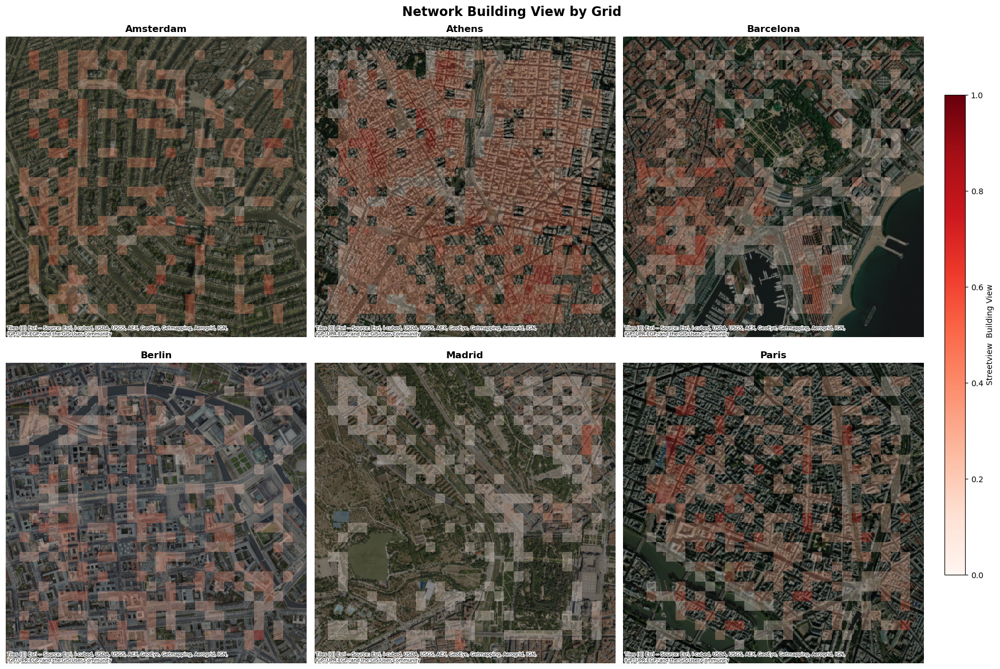

Saved figure to /Users/gerardoezequiel/Developer/ShapingCoolCities/results/figures/urbanity_network_building_view.png


In [23]:
# Visualisation of urbanity features in the grid
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
cities = ['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Madrid', 'Paris']

for ax, city in zip(axes.flat, cities):
    gdf = combined_grid[combined_grid['global_grid_id'].str.startswith(city)]
    values = gdf['streetview_building_view']
    norm = mpl.colors.Normalize(vmin=0, vmax=1)
    cmap = mpl.cm.Reds  # Use Reds colormap for both plot and colorbar
    threshold = 0.01
    colors = [
        (0, 0, 0, 0) if pd.isna(val) or abs(val) < threshold else (*cmap(norm(val))[:3], 0.3)
        for val in values
    ]
    gpd.GeoDataFrame(gdf, geometry='geometry', crs=getattr(combined_grid, 'crs', None)).plot(
        ax=ax, color=colors, edgecolor='none',
        missing_kwds={"color": (1, 1, 1, 0), "label": "Missing"}
    )
    crs = getattr(combined_grid, 'crs', None)
    if crs is not None:
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=crs, attribution_size=6)
        ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, crs=crs, alpha=0.5, attribution_size=6)
    ax.set_title(city, fontsize=12, fontweight='bold')
    ax.set_axis_off()

plt.suptitle('Network Building View by Grid', fontsize=16, fontweight='bold')
plt.tight_layout()
fig_path = FIG_DIR / 'urbanity_network_building_view.png'
# Single colorbar for all subplots, using Reds colormap to match plot
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
sm = mpl.cm.ScalarMappable(cmap='Reds', norm=mpl.colors.Normalize(vmin=0, vmax=1))
sm._A = []
fig.colorbar(sm, cax=cbar_ax, label="Streetview  Building View")

fig.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.subplots_adjust(right=0.9)
plt.show()
print(f'Saved figure to {fig_path}')


## 6. Summary
This section reports coverage of Urbanity metrics after integration so the dissertation can cite data completeness.

In [24]:
# Summary statistics for integrated Urbanity features
print("=== URBANITY INTEGRATION SUMMARY ===")
print(f"Grid cells: {len(combined_grid):,} across {combined_grid['city'].nunique()} European cities")

# Key network metrics by city
network_summary = combined_grid.groupby('city').agg({
    'intersection_density': 'mean',
    'street_length': 'mean', 
    'streetview_green_view': lambda x: x.notna().mean(),
    'canyon_ratio': 'mean'
}).round(3)

network_summary.columns = ['avg_intersection_density', 'avg_street_length_m', 
                          'streetview_coverage', 'avg_canyon_ratio']

display(network_summary)



=== URBANITY INTEGRATION SUMMARY ===
Grid cells: 4,704 across 6 European cities


,avg_intersection_density,avg_street_length_m,streetview_coverage,avg_canyon_ratio
city,,,,
Amsterdam,0.002,362.214,0.298,3.271
Athens,0.002,422.759,0.772,2.810
Barcelona,0.002,423.176,0.364,1.939
Berlin,0.002,279.903,0.337,2.841
Madrid,0.002,409.151,0.318,0.546
Paris,0.002,326.522,0.440,2.853
